<a href="https://www.kaggle.com/code/dhifafikhsansabil/bsi-data-leaked-tweets-eda-and-sentiment-analysis?scriptVersionId=138881369" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# Installing and importing necessary library

In [1]:
# Libraries
!pip install pyspellchecker
!pip install scattertext
!pip install nltk
!pip install -U kaleido

# Import Data Preprocessing and Wrangling libraries
import re
from tqdm.notebook import tqdm
import pandas as pd 
import numpy as np
from datetime import datetime
import dateutil.parser

# Import NLP Libraries
import nltk
from spellchecker import SpellChecker
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA

# Import Visualization Libraries
import plotly.offline as pyo 
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import seaborn as sns 
import scattertext as st
from IPython.display import IFrame
from wordcloud import WordCloud, ImageColorGenerator
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import random 

# Downloading periphrals
nltk.download('vader_lexicon')
nltk.download('stopwords')

import warnings
warnings.filterwarnings('ignore')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 30.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 14.1 MB/s eta 0:00:00


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/nltk/twitter/__init__.py:20: UserWarning: The twython library has not been installed. Some functionality from the twitter package will not be available.
  warnings.warn("The twython library has not been installed. "
/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning:

unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/opt/conda/lib/python3.10/site-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl6StatusC1EN10tensorflow5error4CodeESt17basic_string_viewIcSt11ch

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /usr/share/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Initialization
- Using seaborn's darkgrid format as a default visualization style
- Utilizing SentimentIntensityAnalyzer to determine the user sentiments for every tweet (Positive, Neutral, and Negative)
- The SpellChecker library will be used to fix misspelled words
- Plotly will be utilized to view interactive graphs

In [2]:
df_list = []
df = pd.read_csv('/kaggle/input/bank-bsi-tweets-sentiment-24k-tweets/bsi_24k_tweets.csv')
df_list.append(df)

# Intializate our tools 
sns.set_style('darkgrid')

# For sentiment analysis 
sia = SIA() 

# To identify misspelled words
spell = SpellChecker() 

# To display plotly graphs 
pyo.init_notebook_mode() 

# Storing csv dataset into a datframe
df = pd.concat(df_list)

df.head()

,URL,Date,Tweet,ID,Username,Replies,Reetweets,Likes,Quotes,conversationId,Language,Links,Media,Retweeted Tweet,Bookmarks
0,https://twitter.com/SaidRberdaya/status/165898...,2023-05-17 23:40:12+00:00,@bankbsi_id Layanan BAYAR ke @TakafulKeluarga...,1658980771284279297,SaidRberdaya,0,0,0,0,1658830871812775937,in,NaN,NaN,NaN,0
1,https://twitter.com/ariemayw/status/1658980516...,2023-05-17 23:39:12+00:00,@NurmansyahAff @berlianidris @Paltiwest @bankb...,1658980516857802753,ariemayw,1,0,0,0,1658792156524425218,in,NaN,NaN,NaN,0
2,https://twitter.com/mputhreeeee/status/1658977...,2023-05-17 23:27:12+00:00,@bankbsi_id Udah bisa tarik tunai via ATM atau...,1658977499853000705,mputhreeeee,5,0,0,0,1658830871812775937,in,NaN,NaN,NaN,0
3,https://twitter.com/rahayusheeey/status/165897...,2023-05-17 23:18:39+00:00,@bankbsi_id Jangan lupa perbaiki mbanking untu...,1658975344765054976,rahayusheeey,4,0,0,0,1658830871812775937,in,NaN,NaN,NaN,0
4,https://twitter.com/ndaalfatih_/status/1658975...,2023-05-17 23:17:46+00:00,"@bankbsi_id Min, BSI udah amann dipake belum m...",1658975122894774272,ndaalfatih_,0,0,0,0,1658634424966344704,in,NaN,NaN,NaN,0


# Data Processing

- Fixing the formatting of the date column
- Using regular expressions to fix the structure of the text and remove unnecessary ASCII symbols
- Create a copy of the original dataset and then create two new columns in the copied dataset called original_tweet and datetime. The original_tweet column contains the original tweet text, while the datetime column contains the date and time of the tweet as a datetime object
- Dropping the date and time columns from the dataset
- Transforming the datetime column using the apply method and the lambda function. This converts the datetime column from a string to a datetime object using the specified format string.
- Doing a boolean mask using the apply method and the lambda function to identify retweets. This is done by checking if the string RT @ is present in the tweet text.
- Converting all the text to lowercase, removing Twitter handles (usernames starting with @), removing hashtags, removing URLs, removing special characters, and removing all single characters. Finally, multiple spaces are substituted with a single space.

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24401 entries, 0 to 24400
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   URL              24401 non-null  object 
 1   Date             24401 non-null  object 
 2   Tweet            24401 non-null  object 
 3   ID               24401 non-null  int64  
 4   Username         24401 non-null  object 
 5   Replies          24401 non-null  int64  
 6   Reetweets        24401 non-null  int64  
 7   Likes            24401 non-null  int64  
 8   Quotes           24401 non-null  int64  
 9   conversationId   24401 non-null  int64  
 10  Language         24401 non-null  object 
 11  Links            924 non-null    object 
 12  Media            2203 non-null   object 
 13  Retweeted Tweet  0 non-null      float64
 14  Bookmarks        24401 non-null  int64  
dtypes: float64(1), int64(7), object(7)
memory usage: 2.8+ MB


In [4]:
data = df.copy()
data['original_tweet'] = df['Tweet']
data['datetime'] = data['Date']
data['datetime'] = data.datetime.apply(lambda x: dateutil.parser.parse(x))
rt_mask = data.Tweet.apply(lambda x: "RT @" in x)

# standard tweet preprocessing 
data.Tweet = data.Tweet.str.lower()
#Remove twitter handlers
data.Tweet = data.Tweet.apply(lambda x:re.sub('@[^\s]+','',x))
#remove hashtags
data.Tweet = data.Tweet.apply(lambda x:re.sub(r'\B#\S+','',x))
# Remove URLS
data.Tweet = data.Tweet.apply(lambda x:re.sub(r"http\S+", "", x))
# Remove all the special characters
data.Tweet = data.Tweet.apply(lambda x:' '.join(re.findall(r'\w+', x)))
#remove all single characters
data.Tweet = data.Tweet.apply(lambda x:re.sub(r'\s+[a-zA-Z]\s+', '', x))
# Substituting multiple spaces with single space
data.Tweet = data.Tweet.apply(lambda x:re.sub(r'\s+', ' ', x, flags=re.I))

# convert the 'date' column to datetime format and remove the timezone information
data['datetime'] = pd.to_datetime(data['datetime']).dt.tz_localize(None)


# Viewing the preprocessed data
data.head()

,URL,Date,Tweet,ID,Username,Replies,Reetweets,Likes,Quotes,conversationId,Language,Links,Media,Retweeted Tweet,Bookmarks,original_tweet,datetime
0,https://twitter.com/SaidRberdaya/status/165898...,2023-05-17 23:40:12+00:00,layanan bayar ke sudah bisa blm ya kok jadi re...,1658980771284279297,SaidRberdaya,0,0,0,0,1658830871812775937,in,NaN,NaN,NaN,0,@bankbsi_id Layanan BAYAR ke @TakafulKeluarga...,2023-05-17 23:40:12
1,https://twitter.com/ariemayw/status/1658980516...,2023-05-17 23:39:12+00:00,apa mungkin dah ganti vendor,1658980516857802753,ariemayw,1,0,0,0,1658792156524425218,in,NaN,NaN,NaN,0,@NurmansyahAff @berlianidris @Paltiwest @bankb...,2023-05-17 23:39:12
2,https://twitter.com/mputhreeeee/status/1658977...,2023-05-17 23:27:12+00:00,udah bisa tarik tunai via atm atau ke teller g...,1658977499853000705,mputhreeeee,5,0,0,0,1658830871812775937,in,NaN,NaN,NaN,0,@bankbsi_id Udah bisa tarik tunai via ATM atau...,2023-05-17 23:27:12
3,https://twitter.com/rahayusheeey/status/165897...,2023-05-17 23:18:39+00:00,jangan lupa perbaiki mbanking untuk topup,1658975344765054976,rahayusheeey,4,0,0,0,1658830871812775937,in,NaN,NaN,NaN,0,@bankbsi_id Jangan lupa perbaiki mbanking untu...,2023-05-17 23:18:39
4,https://twitter.com/ndaalfatih_/status/1658975...,2023-05-17 23:17:46+00:00,min bsi udah amann dipake belum minn,1658975122894774272,ndaalfatih_,0,0,0,0,1658634424966344704,in,NaN,NaN,NaN,0,"@bankbsi_id Min, BSI udah amann dipake belum m...",2023-05-17 23:17:46


# Feature Extraction
Initialized libraries above to fix spelling mistakes and apply Sentiment analysis to the individual tweets. The datetime column will also be feature engineered into different types so that it could be used for further visualizations later on.

In [5]:
def label_sentiment(x:float):
    if x < -0.05 : return 'negative'
    if x > 0.35 : return 'positive'
    return 'neutral'

# Feature Extraction
data['words'] = data.Tweet.apply(lambda x:re.findall(r'\w+', x ))
data['errors'] = data.words.apply(spell.unknown)
data['errors_count'] = data.errors.apply(len)
data['words_count'] = data.words.apply(len)
data['sentence_length'] = data.Tweet.apply(len)
data['hour'] = data.datetime.apply(lambda x: x.hour)
data['date'] = data.datetime.apply(lambda x: x.date())
data['month'] = data.datetime.apply(lambda x: x.month)
data['year'] = data.datetime.apply(lambda x: x.year)


# Extract Sentiment Values for each tweet 
data['sentiment'] = [sia.polarity_scores(x)['compound'] for x in tqdm(data['Tweet'])]
data['overall_sentiment'] = data['sentiment'].apply(label_sentiment);

  0%|          | 0/24401 [00:00<?, ?it/s]

# EDA and Data Visualization
- Performing simple Exploratory data analysis and visualize the data. 
- Checking missing values, do statistical analysis and view relationships between different data columns.

In [6]:
# Get the count of non-null values for each column
column_counts = data.count()

# Create the bar chart
fig = go.Figure(go.Bar(
    x=column_counts.index,
    y=column_counts.values
))

# Add axis labels and title
fig.update_layout(
    xaxis_title="Column",
    yaxis_title="Count",
    title="Number of Rows per Column",
    title_font=dict(size=20),
    font=dict(size=14),
    height=600,
    template='plotly_dark'
)

# Add a subtitle and subheader
fig.add_annotation(
    xref='paper', yref='paper',
    x=0.5, y=1.15,
    text='<b>Data Column Count Distribution</b>',
    showarrow=False,
    font=dict(size=24)
)

fig.add_annotation(
    xref='paper', yref='paper',
    x=0.5, y=1.05,
    text='Number of non-null rows per column in the dataset',
    showarrow=False,
    font=dict(size=16)
)

# Show the chart
fig.show()
fig.write_image('Data Column Count Distribution.png')

In [7]:
# Get the count of missing values for each column
column_na_count = data.isna().sum()

# Create the bar chart
fig = go.Figure(go.Bar(
    x=column_na_count.index,
    y=column_na_count.values,
    marker_color='rgb(253, 128, 93)' # Set custom color for the bars
))

# Add axis labels and title
fig.update_layout(
    xaxis_title="Column",
    yaxis_title="Missing Value Count",
    title="Missing Values per Column",
    font=dict(
        size=14,
        color='white'
    ),
    plot_bgcolor='rgb(17, 17, 17)', # Set dark background color
    paper_bgcolor='rgb(17, 17, 17)', # Set dark background color for the entire plot
)

# Add subheader
fig.add_annotation(
    x=0.5,
    y=1.1,
    xref='paper',
    yref='paper',
    text="<b>Number of missing values per column</b>",
    showarrow=False,
    font=dict(
        size=16,
        color='white'
    )
)

# Show the chart
fig.show()
fig.write_image('Missing Values per Column.png')

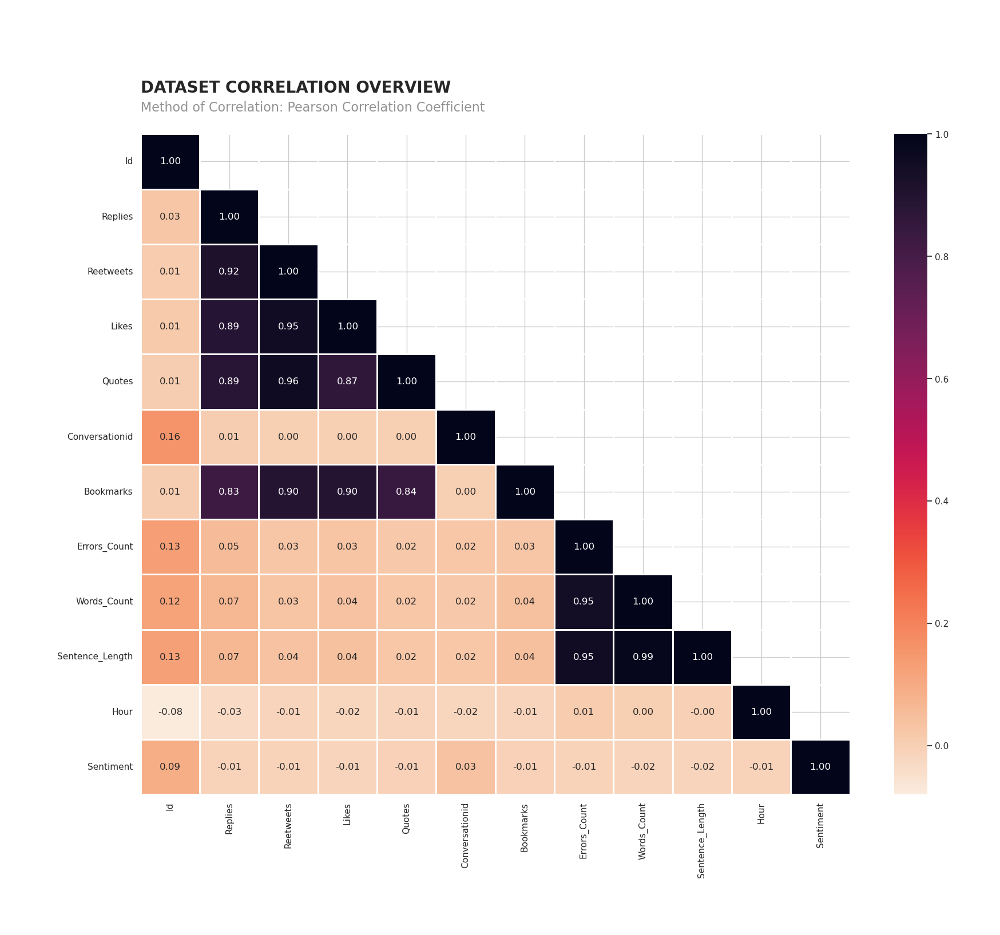

In [8]:
def plot_heatmap(data, cmap=sns.color_palette(palette='rocket_r', as_cmap=True), height=3, linewidth=1, title=' ', subtitle=' '):
    sns.set(style = 'whitegrid', rc = {'figure.figsize': (20,height)})

    mask = np.zeros_like(data, dtype=bool)
    mask[np.triu_indices_from(mask)] = True
    mask[np.diag_indices_from(mask)] = False

    g = sns.heatmap(data=data, cmap=cmap,
                    linewidths=linewidth,
                    annot=True,
                    fmt='.2f',
                    mask=mask,
                    cbar_kws=dict(location='right'))

    g.set_xlabel(' \n\n\n\n')
    g.set_ylabel(' \n\n\n\n')

    g.set_xticklabels([tick_label.get_text().title() for tick_label in g.get_xticklabels()])
    g.set_yticklabels([tick_label.get_text().title() for tick_label in g.get_yticklabels()])

    g.set_title(f'\n\n\n\n{title}\n\n'.upper(),
                loc='left',
                fontdict=dict(
                    fontsize=20,
                    fontweight='bold'))

    plt.text(s=f'{subtitle}',
             alpha=0.5,
             x=0,
             y=-0.6,
             horizontalalignment='left',
             verticalalignment='top',
             fontsize=16)

    plt.text(s=' ',
             x=1.2,
             y=1,
             transform=g.transAxes)
    plt.savefig('corelation.png')
    return g

plot_heatmap(
    height=15,
    
    data=data.drop(['Retweeted Tweet', 'Language', 'year', 'month'], axis=1).corr(),
    title='Dataset Correlation Overview',
    subtitle='Method of Correlation: Pearson Correlation Coefficient'
);

In [9]:
# create a line plot with Plotly Express

fig = px.line(data, x='datetime', y='Tweet', title='Tweets Over Time', template='plotly_dark')

# display the plot
fig.show()
fig.write_image('Tweet Over Time.png')

In [10]:
df_copy = data.copy()

def get_multi_line_title(title, subtitle):
    return f"{title}<br><sub>{subtitle}</sub>"

title = get_multi_line_title(
    "Activity all over the day", 
    "BSI Data Leaked")

annual_counts = pd.DataFrame(df_copy['hour'].value_counts()).reset_index()
annual_counts.columns = ['hour', 'count']
annual_counts = annual_counts[annual_counts['hour'] != 2021].sort_values('hour')

fig = go.Figure(go.Bar(
    name="Annual Count", 
    x=annual_counts.hour, 
    y=annual_counts['count'], 
    marker_color=annual_counts['count'] 
))
# plt.xticks(range(1,25))
fig.update_layout(
    template='plotly_dark', 
    title=title, 
    xaxis = dict(
        tickvals=np.arange(0,24), 
        ticktext=[f"{h:02d}:00" for h in range(24)]
    )
)
fig.show()
fig.write_image('Number of Activity per hour period of the day.png')

In [11]:
title = get_multi_line_title("Time of the day most Tweeted", "")

def format_hour(h: int):
    h = str(h)
    if len(h) == 1: 
        h = '0'+h
    h = h+ ":00"
    return h

oc = df_copy
hourly = oc.groupby('hour')['Tweet'].count()
hourly = pd.DataFrame(hourly).reset_index()
hourly.columns =['Hour of Day',"Number of Tweets"]
hourly['Hour of Day'] = hourly['Hour of Day'].apply(format_hour)

fig = px.line_polar(
    data_frame=hourly,
    r = 'Number of Tweets',
    theta='Hour of Day',
    line_close=True,
    color_discrete_sequence=['crimson'],
)

fig.update_layout(
    title=title, 
    template="plotly_dark",
    title_x=0.5,
    height=900,
#     width=900
)

fig.write_image('Time of day most tweeted.png')
fig.show()

In [12]:
title = get_multi_line_title(
    'Sentiment Distribution',
    "What are the sentiments of Twitter Users about BSI Data Leaked?"
)

sentiment_pie = pd.DataFrame(df_copy['overall_sentiment'].value_counts() / df_copy.shape[0]*100).reset_index()
sentiment_pie.columns = ['Sentiment', 'Percentage']
fig = px.pie(sentiment_pie, values='Percentage', names='Sentiment', title=title)

fig.update_traces(marker=dict(colors=['#00adb5', '#f8b195', '#f67280']), textposition='inside')
fig.update_layout(
    title=title,
    title_x=0.48,
    template='plotly_dark',
    font=dict(
        family='Arial',
        size=20,  # Increase label font size to 20
        color='white'
    ),
    height=700,
    legend=dict(
        title='',
        orientation='h',
        yanchor='bottom',
        y=-0.15,
        xanchor='center',
        x=0.5,
        font=dict(
            family='Arial',
            size=12,
            color='white'
        )
    )
)
fig.write_image('Sentiment Distribution.png')
fig.show()

In [13]:
sentiment_over_time = df_copy.sort_values('hour')[['hour', 'sentiment', 'overall_sentiment']]
annual_sentiment = pd.DataFrame(sentiment_over_time.groupby('hour')['overall_sentiment'].value_counts())
annual_sentiment.columns = ['Count']
annual_sentiment = annual_sentiment.reset_index()

title = get_multi_line_title('Hourly Tweet Sentiment', "Tweet Sentiments all over the day")
years = annual_sentiment.hour.unique().tolist()
sents = {'positive' : 'mediumseagreen', 'negative': 'crimson', 'neutral': 'royalblue'}

sentiment_bars = [] 
for s in sents.keys():
    current_year = annual_sentiment[annual_sentiment.overall_sentiment == s]
    sentiment_bars.append(
        go.Bar(name=s, x=current_year.hour, y=current_year.Count, marker_color=sents[s])
    )

fig = go.Figure(sentiment_bars)
fig.update_layout(
    template='plotly_dark',
    title=title,
    xaxis=dict(
        title='Time of Day',
        tickmode='array',
        tickvals=[0, 4, 8, 12, 16, 20, 24],
        ticktext=['12AM', '4AM', '8AM', '12PM', '4PM', '8PM', '12AM'],
        tickangle=0,
        showgrid=False,
        showline=True,
        linewidth=1,
        linecolor='white',
        mirror=True,
        gridcolor='white',
        zeroline=False,
    ),
    yaxis=dict(
        title='Count',
        showgrid=False,
        showline=True,
        linewidth=1,
        linecolor='white',
        mirror=True,
        gridcolor='white',
    ),
    legend=dict(
        title='',
        orientation='h',
        yanchor='bottom',
        y=-0.15,
        xanchor='center',
        x=0.5,
        font=dict(
            family='Arial',
            size=12,
            color='white'
        )
    )
)
fig.write_image('Hourly tweet sentiment.png')
fig.show()

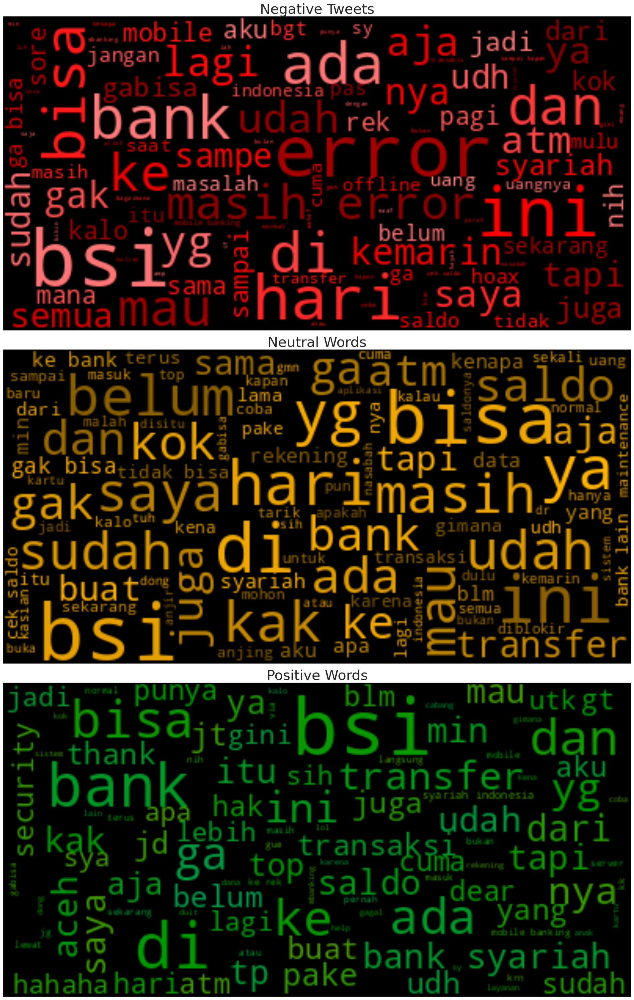

In [14]:
def flatten_list(l):
    return [x for y in l for x in y]

# color coding our wordclouds 
def red_color_func(word, font_size, position, orientation, random_state=None,**kwargs):
    return f"hsl(0, 100%, {random.randint(25, 75)}%)" 

def green_color_func(word, font_size, position, orientation, random_state=None,**kwargs):
    return f"hsl({random.randint(90, 150)}, 100%, 30%)" 

def yellow_color_func(word, font_size, position, orientation, random_state=None,**kwargs):
    return f"hsl(42, 100%, {random.randint(25, 50)}%)" 

def generate_word_clouds(neg_doc, neu_doc, pos_doc):
    # Display the generated image:
    fig, axes = plt.subplots(3, 1, figsize=(20,30))
    wordcloud_neg = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(" ".join(neg_doc))
    axes[0].imshow(wordcloud_neg.recolor(color_func=red_color_func, random_state=3), interpolation='bilinear')
    axes[0].set_title("Negative Tweets", fontsize=30)
    axes[0].axis("off")

    wordcloud_neu = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(" ".join(neu_doc))
    axes[1].imshow(wordcloud_neu.recolor(color_func=yellow_color_func, random_state=3), interpolation='bilinear')
    axes[1].set_title("Neutral Words", fontsize=30)
    axes[1].axis("off")
    
    wordcloud_pos = WordCloud(max_font_size=50, max_words=100, background_color="black").generate(" ".join(pos_doc))
    axes[2].imshow(wordcloud_pos.recolor(color_func=green_color_func, random_state=3), interpolation='bilinear')
    axes[2].set_title("Positive Words", fontsize=30)
    axes[2].axis("off")
    plt.savefig('wordcloud.png')

    plt.tight_layout()
    plt.subplots_adjust(wspace=1.5)
#     plt.style.use('dark_background')
    plt.show()


sentiment_sorted= data.sort_values('hour', ascending=False)
positive_top_100 = sentiment_sorted[sentiment_sorted['overall_sentiment'] == "positive"].iloc[:100]
negative_top_100 = sentiment_sorted[sentiment_sorted['overall_sentiment'] == "negative"].iloc[:100]
neutral_top_100 = sentiment_sorted[sentiment_sorted['overall_sentiment'] == "neutral"].iloc[:100]

cleanup = lambda x: [y for y in x.split() if y not in stopwords.words('english')]
neg_doc = flatten_list(negative_top_100['Tweet'].apply(cleanup))
pos_doc = flatten_list(positive_top_100['Tweet'].apply(cleanup))
neu_doc = flatten_list(neutral_top_100['Tweet'].apply(cleanup))

generate_word_clouds(neg_doc, neu_doc, pos_doc)